# CMPE-788: Final Project Part 3



## 3. Building classification models before re-sampling

### 3.1 Import preprocessed data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler

df = df = pd.read_csv('/content/drive/MyDrive/IDS2018/processed_friday_dataset.csv')

<ipython-input-18-797d2cf23508>:7: DtypeWarning: Columns (70) have mixed types. Specify dtype option on import or set low_memory=False.
  df = df = pd.read_csv('/content/drive/MyDrive/IDS2018/processed_friday_dataset.csv')


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2127535 entries, 0 to 2127534
Data columns (total 75 columns):
 #   Column              Dtype  
---  ------              -----  
 0   flow duration       int64  
 1   tot fwd pkts        int64  
 2   tot bwd pkts        int64  
 3   totlen fwd pkts     int64  
 4   totlen bwd pkts     float64
 5   fwd pkt len max     int64  
 6   fwd pkt len min     int64  
 7   fwd pkt len mean    float64
 8   fwd pkt len std     float64
 9   bwd pkt len max     int64  
 10  bwd pkt len min     int64  
 11  bwd pkt len mean    float64
 12  bwd pkt len std     float64
 13  flow iat mean       float64
 14  flow iat std        float64
 15  flow iat max        float64
 16  flow iat min        float64
 17  fwd iat tot         float64
 18  fwd iat mean        float64
 19  fwd iat std         float64
 20  fwd iat max         float64
 21  fwd iat min         float64
 22  bwd iat tot         float64
 23  bwd iat mean        float64
 24  bwd iat std         floa

#### Features correlation matrix

<ipython-input-3-ec87bcabf3a7>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = df.corr()


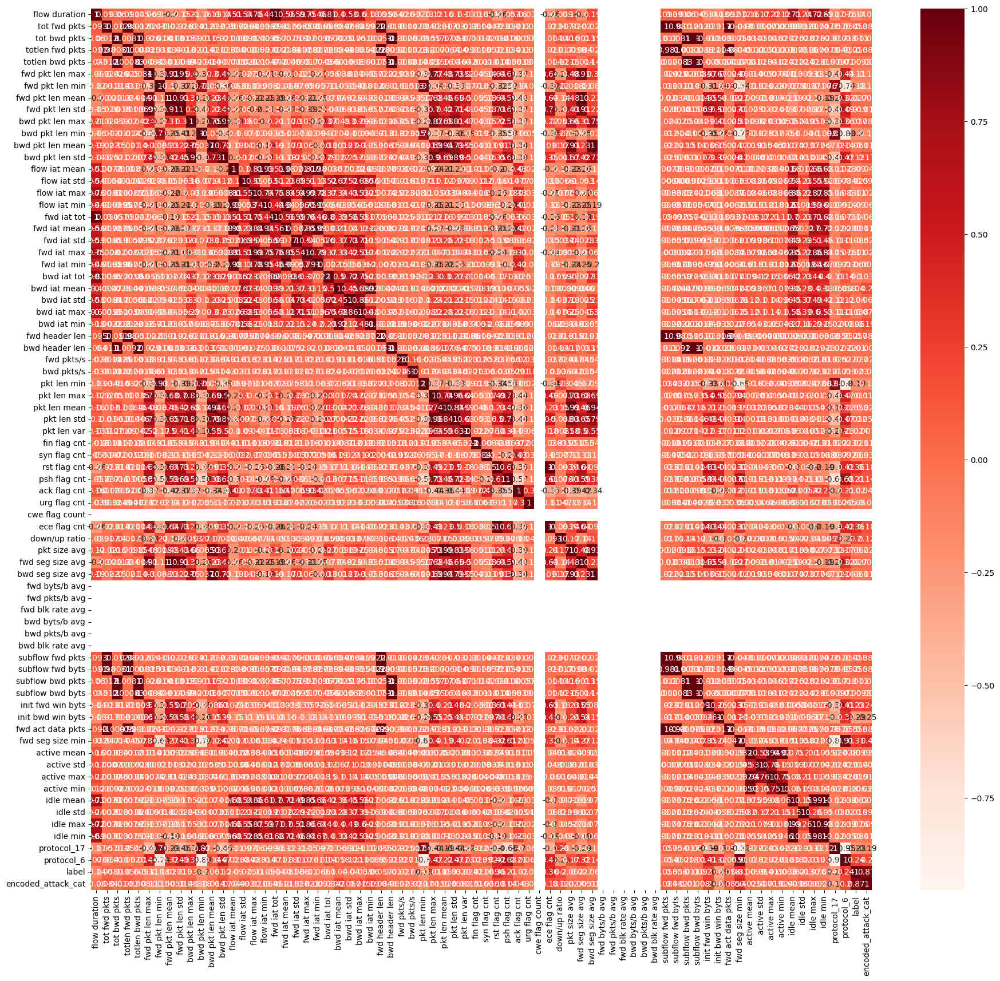

In [ ]:
# Visualize Correlation between Columns
plt.figure(figsize=(22,20))
cor = df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

#### Remove highly correlated features

In [ ]:
# fwd seg size min, init fwd win byts
df.drop(columns=['fwd seg size min', 'init fwd win byts'], inplace=True)


### 3.2 Making an 70/30 train/test split with multi labels-classification

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, matthews_corrcoef

train, test = train_test_split(df, test_size=0.3, random_state=42)

print("Full dataset:\n")
print("Benign: " + str(df["label"].value_counts()[[0]].sum()))
print("Malicious: " + str(df["label"].value_counts()[[1]].sum()))
print("---------------")

print("Training set:\n")
print("Benign: " + str(train["label"].value_counts()[[0]].sum()))
print("Malicious: " + str(train["label"].value_counts()[[1]].sum()))
print("---------------")

print("Test set:\n")
print("Benign: " + str(test["label"].value_counts()[[0]].sum()))
print("Malicious: " + str(test["label"].value_counts()[[1]].sum()))


Full dataset:

Benign: 1731095
Malicious: 396440
---------------
Training set:

Benign: 1211967
Malicious: 277307
---------------
Test set:

Benign: 519128
Malicious: 119133


Train Sets:

In [ ]:
# create a train set that contains all traffic instances
y_train_all_multiClass = np.array(train['encoded_attack_cat'])
y_train_all_binaryClass = np.array(train['label'])
X_train_all = train.drop(['label', 'attack_cat', 'encoded_attack_cat'], axis=1)


# create a train set that contains only attacks
malicious_train = train.loc[train['encoded_attack_cat'] != 0]
y_train_attack_multiClass = np.array(malicious_train['encoded_attack_cat'])
X_train_attack = malicious_train.drop(['label', 'attack_cat', 'encoded_attack_cat'], axis=1)

Test Sets:

In [ ]:
# create a test set that contains all traffic instances
y_test_all_multiClass = np.array(test["encoded_attack_cat"])
y_test_all_binaryClass = np.array(test["label"])
X_test_all = test.drop(['label', 'attack_cat', 'encoded_attack_cat'], axis=1)

# create a test set that contains only attacks
malicious_test = test.loc[test['encoded_attack_cat'] != 0]
y_test_attack = np.array(malicious_test['encoded_attack_cat'])
X_test_attack = malicious_test.drop(['label', 'attack_cat', 'encoded_attack_cat'], axis=1)

In [ ]:
malicious_test['attack_cat'].unique()

array(['DDOS attack-HOIC', 'Bot', 'DoS attacks-GoldenEye',
       'DoS attacks-Slowloris', 'DDOS attack-LOIC-UDP'], dtype=object)

### 3.3 Train ML models with dimensionality reduction


#### Standardize the data

In [ ]:
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()
X = scaler.fit_transform(y_train_all_multiClass)

#### Dimensionality reduction

PCA:

In [ ]:
from sklearn.decomposition import PCA

# Compute the principal components
pca = PCA(n_components=None)
X_pca = pca.fit_transform(X)

Analyze the results of the PCA by looking at the explained variance ratio of each principal component. The explained variance ratio tells us how much of the total variance in the data is explained by each principal component

In [ ]:
# Analyze the results
print(pca.explained_variance_ratio_)

[1.92282315e-01 1.68517310e-01 9.55913316e-02 8.75712049e-02
 7.51929849e-02 5.47710088e-02 4.61332089e-02 4.06859238e-02
 2.41192326e-02 2.17406421e-02 1.84170066e-02 1.62709866e-02
 1.58721263e-02 1.53760876e-02 1.49043787e-02 1.42351973e-02
 1.31948226e-02 1.23953178e-02 1.11340846e-02 9.47690663e-03
 7.95989517e-03 7.69489380e-03 7.22321293e-03 6.57142963e-03
 5.23900180e-03 4.28543944e-03 2.95854769e-03 2.68977072e-03
 1.58228278e-03 1.42604816e-03 8.44878054e-04 7.53530158e-04
 6.50408863e-04 4.18885558e-04 3.56025414e-04 3.32361599e-04
 2.54626286e-04 1.80812389e-04 1.64736674e-04 1.26585758e-04
 8.73125845e-05 7.36673143e-05 5.65240217e-05 3.91965871e-05
 3.71259061e-05 3.24074400e-05 1.79443557e-05 1.65286757e-05
 1.28506720e-05 9.58579610e-06 6.00499907e-06 5.92935548e-06
 5.01678522e-06 2.65165271e-06 1.38275065e-06 3.84565984e-07
 2.20722843e-08 1.46198965e-08 1.87495630e-25 1.94430416e-32
 1.15441640e-32 1.51429158e-33 1.21042009e-33 1.21042009e-33
 1.21042009e-33 1.210420

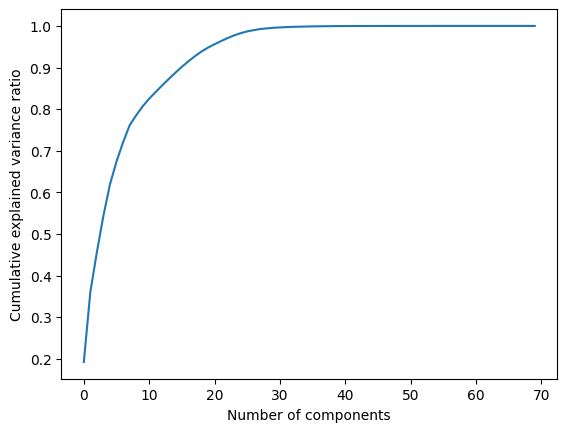

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Plot the cumulative explained variance ratio
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance ratio')
plt.show()

Transform the data into the new coordinate system defined by the selected principal components. Keep enough components to explain a certain percentage of the total variance in the data, such as 90% or 95%.



In [ ]:
# Transform the data
pca = PCA(n_components=66)
X_pca = pca.fit_transform(X)

#### Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt_model=DecisionTreeClassifier()
dt_model.fit(X_pca, y_train_all_multiClass)

# dt_pred = dt_model.predict(X_test_all)

# print(classification_report(y_test_all_multiClass,dt_pred))

In [ ]:
X_test_all_pca = pca.fit_transform(X_test_all)
dt_pred = dt_model.predict(X_test_all_pca)

print(classification_report(y_test_all_multiClass,dt_pred))

              precision    recall  f1-score   support

           0       0.76      0.70      0.73    519128
           1       0.00      0.00      0.00     43550
           2       0.00      0.00      0.00     59701
           3       0.10      0.42      0.16       517
           4       0.00      0.00      0.00     12457
           5       0.01      0.03      0.01      2908

    accuracy                           0.57    638261
   macro avg       0.15      0.19      0.15    638261
weighted avg       0.62      0.57      0.59    638261



Decision Trees are not known to be particularly sensitive to high-dimensional data, so reducing the dimensionality with PCA may not always be necessary or helpful. However, it's still possible to use PCA as a preprocessing step for a Decision Tree model.

In some cases, reducing the dimensionality of the data with PCA can help to improve the performance of a Decision Tree model, especially if the original data has a large number of irrelevant or redundant features that can negatively impact the performance of the model.

However, it's important to note that PCA can also result in loss of information, and if the number of principal components selected is too small, then the compressed data may not capture enough of the original data's variability, which can result in poorer performance of the Decision Tree model.

Therefore, whether or not a Decision Tree model works well after PCA depends on the specific dataset and problem at hand. It's important to experiment with different approaches, including using PCA or not using it, and selecting the appropriate number of principal components to determine which approach works best for your particular problem

### 3.5 Train ML models without dimensionality reduction

#### Multi-class classification

In [ ]:
from sklearn.tree import DecisionTreeClassifier


dt_model=DecisionTreeClassifier()
dt_model.fit(X_train_all, y_train_all_multiClass)
dt_pred = dt_model.predict(X_test_all)

print(classification_report(y_test_all_multiClass,dt_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00   1038388
           1       1.00      0.99      0.99     86742
           2       0.98      0.96      0.97    119609
           3       1.00      1.00      1.00      1032
           4       1.00      1.00      1.00     24885
           5       0.99      0.99      0.99      5865

    accuracy                           0.99   1276521
   macro avg       0.99      0.99      0.99   1276521
weighted avg       0.99      0.99      0.99   1276521



#### Binary-class classification

In [ ]:
dt_model=DecisionTreeClassifier()
dt_model.fit(X_train_all, y_train_all_binaryClass)
dt_pred = dt_model.predict(X_test_all)

print(classification_report(y_test_all_binaryClass,dt_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00   1038388
           1       0.99      0.98      0.98    238133

    accuracy                           0.99   1276521
   macro avg       0.99      0.99      0.99   1276521
weighted avg       0.99      0.99      0.99   1276521



AUC score: 0.9859056764471108


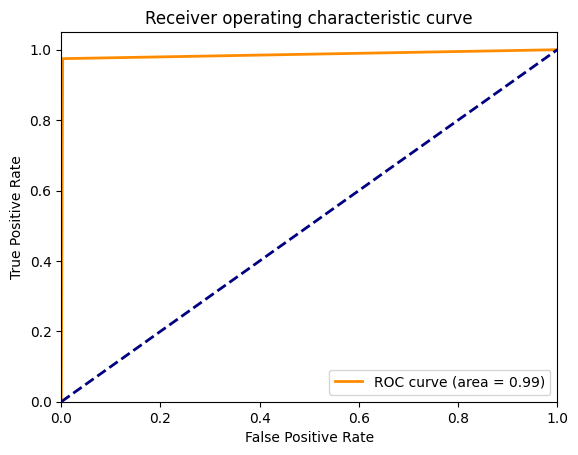

In [ ]:
# validate Ml model:

# AUC
from sklearn.metrics import roc_auc_score, roc_curve, auc

auc_score = roc_auc_score(y_test_all_binaryClass, dt_pred)
 
print('AUC score:', auc_score)

# y_test and y_score are the true labels and predicted scores, respectively
fpr, tpr, _ = roc_curve(y_test_all_binaryClass, dt_pred)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic curve')
plt.legend(loc="lower right")
plt.show()

In [ ]:
# K-fold Cross Validation
from sklearn.model_selection import KFold, cross_val_score

# Define the k-fold cross-validation method
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Evaluate the model using cross-validation
dt_model=DecisionTreeClassifier()
scores = cross_val_score(dt_model, X_train, y_train, cv=kfold, scoring='roc_auc')

# Print the AUC scores for each fold
print('AUC Scores:', scores)

# Calculate the mean AUC score and standard deviation
mean_auc = scores.mean()
std_auc = scores.std()

# Fit the model to the full training set and calculate AUC on the test set
dt_model.fit(X_train, y_train)
y_pred = dt_model.predict_proba(X_test)[:, 1]
test_auc = roc_auc_score(y_test, y_pred)

# Print the mean AUC score and test AUC score
print('Mean AUC:', mean_auc)
print('Test AUC:', test_auc)

AUC Scores: [0.99128179 0.99180641 0.99166247 0.99179738 0.99206999 0.99201215
 0.99181372 0.99210367 0.99186124 0.99197694]
Mean AUC: 0.9918385778513235
Test AUC: 0.9922689508788134


#### Test on attack set only - multiclass classification

In [ ]:
# Train Attack - Test Attack -> Useless

dt_model=DecisionTreeClassifier()
dt_model.fit(X_train_attack, y_train_attack_multiClass)
dt_pred = dt_model.predict(X_test_attack)

print(classification_report(y_test_attack,dt_pred))

              precision    recall  f1-score   support

           1       0.99      1.00      1.00     43550
           2       1.00      1.00      1.00     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       1.00      1.00      1.00      2908

    accuracy                           1.00    119133
   macro avg       1.00      1.00      1.00    119133
weighted avg       1.00      1.00      1.00    119133



In [ ]:
# Train All - Test attack
from sklearn.tree import DecisionTreeClassifier

dt_model=DecisionTreeClassifier()
dt_model.fit(X_train_all, y_train_all_multiClass)
dt_pred = dt_model.predict(X_test_attack)

print(classification_report(y_test_attack,dt_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.99      1.00     43550
           2       1.00      0.96      0.98     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       1.00      0.99      1.00      2908

    accuracy                           0.97    119133
   macro avg       0.83      0.82      0.83    119133
weighted avg       1.00      0.97      0.99    119133



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


[[    0     0     0     0     0     0]
 [  380 43151    19     0     0     0]
 [ 2619    33 57049     0     0     0]
 [    0     0     0   517     0     0]
 [    3     0     0     0 12454     0]
 [   23     0     0     0     0  2885]]


<Axes: >

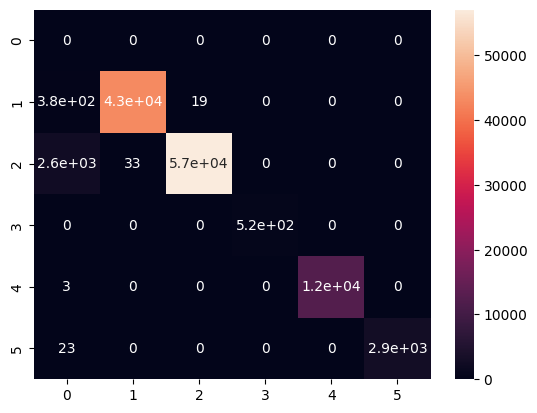

In [ ]:
# confusion matrix
cm = confusion_matrix(y_test_attack, dt_pred)

# Print confusion matrix as text
print(cm)

# Plot confusion matrix as heatmap
sns.heatmap(cm, annot=True)

Will try to improve this model

## 4. Re-sampling the dataset

#### SMOTE

Network traffic distribution

277307 of 1489274 network flows are attacks and it is the 18.62% of the data set.
1211967 of 1489274 network flows are normal and it is the 81.38% of the data set.


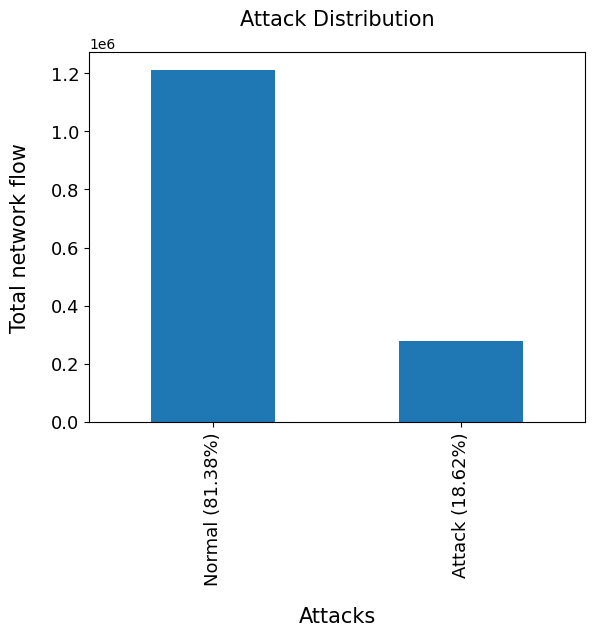

In [ ]:
# attacks vs normal
attack = train['label'].value_counts()[1]
normal = train['label'].value_counts()[0]
attack_per = attack / train.shape[0] * 100
normal_per = normal / train.shape[0] * 100

print('{} of {} network flows are attacks and it is the {:.2f}% of the data set.'.format(attack, train.shape[0], attack_per))
print('{} of {} network flows are normal and it is the {:.2f}% of the data set.'.format(normal, train.shape[0], normal_per))


# count the occurrences of each unique value in the 'name' column
counts = train['label'].value_counts()

# plot the result as a bar plot
counts.plot(kind='bar')

# set x and y labels and a title for the plot
plt.xlabel('Attacks', size=15, labelpad=15)
plt.ylabel('Total network flow', size=15, labelpad=15)
plt.xticks((0, 1), ['Normal ({0:.2f}%)'.format(normal_per), 'Attack ({0:.2f}%)'.format(attack_per)])
plt.tick_params(axis='x', labelsize=13)
plt.tick_params(axis='y', labelsize=13)

plt.title('Attack Distribution', size=15, y=1.05)

# display the plot
plt.show()

Malicious traffic flows distribution

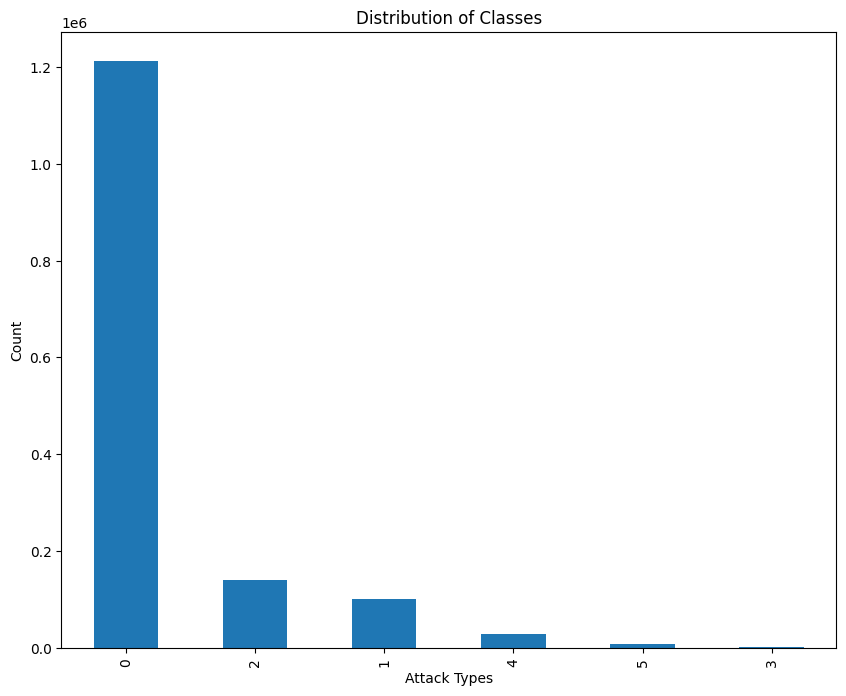

In [ ]:
# all attack categories

attack_categories = train['encoded_attack_cat'].value_counts()

# Create a new figure with a custom size
plt.figure(figsize=(10, 8))

attack_categories.plot(kind='bar')
plt.title('Distribution of Classes')
plt.xlabel('Attack Types')
plt.ylabel('Count')
plt.show()

Implement SMOTE

In [ ]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X_train_all, y_train_all_multiClass)

Double check class distribution one more time

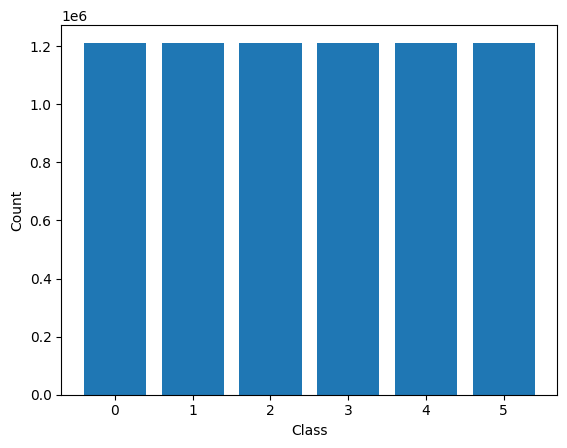

In [ ]:
# Get the class distribution of the resampled data
unique, counts = np.unique(y_res, return_counts=True)

# Create a bar plot of the class distribution
plt.bar(unique, counts)
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

Rerun Decision Tree

In [ ]:
dt_model=DecisionTreeClassifier()
dt_model.fit(X_res, y_res)

dt_pred = dt_model.predict(X_test_attack)

print(classification_report(y_test_attack,dt_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.99      0.99     43550
           2       1.00      0.97      0.99     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       1.00      0.99      1.00      2908

    accuracy                           0.98    119133
   macro avg       0.83      0.83      0.83    119133
weighted avg       1.00      0.98      0.99    119133



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Overall, slightly better. Accuracy and recall increase by 0.1. Customizable params for SMOTE():

* **sampling_strategy**: This parameter specifies the desired ratio of the number of samples in the minority class to the number of samples in the majority class after resampling. If set to 'auto', the ratio is set to the inverse of the class frequencies.

* **k_neighbors**: This parameter specifies the number of nearest neighbors to use when interpolating new samples. The default value is 5.

* **random_state**: This parameter sets the seed for the random number generator used by SMOTE.

* **n_jobs**: This parameter specifies the number of CPU cores to use for parallelization. The default value is 1, but you can set it to -1 to use all available CPU cores.

Other choices that have been considered:


*   ADASYN: not suitabel for this dataset
*   SMOTE-NC: not many categorical features, won't be too useful. Will implenment this after adding categorical features



**Finetunning SMOTE (k_neighbors):**

  * Finding optimal value of **k_neighbors**: The **k_neighbors** parameter is used to specify the number of nearest neighbors to consider when generating synthetic samples in the SMOTE algorithm. SMOTE selects k_neighbors nearest neighbors from the minority class and creates a synthetic sample by interpolating between the original example and one of its selected nearest neighbors. The choice of k_neighbors is important, as it affects the degree of interpolation between the original minority class examples and their neighbors. If k_neighbors is too small, then the synthetic samples may be too similar to the original minority class examples, leading to overfitting. If k_neighbors is too large, then the synthetic samples may be too dissimilar from the original minority class examples, leading to underfitting or introducing noise into the data. 

* In general, a good starting point is to set k_neighbors to the value of the square root of the number of minority class examples. For example, if you have 100 minority class examples, you could set k_neighbors to 10, which is the square root of 100.

* Needs to experiment with different values of k_neighbors and compare the performance of the model on a validation set to find the optimal value for your particular problem. Can also use techniques such as **cross-validation** to evaluate the performance of different k_neighbors values on your dataset

* In this case, the minority class is significantly smaller than the majority class, so we would need to use a relatively large k_neighbors value to generate enough synthetic samples to balance the classes. A common range of k_neighbors values to try is between 5 and 50, but we can experiment with larger values as well.

In [ ]:
# get the unique values and their counts
unique_vals, counts = np.unique(y_train_all_multiClass, return_counts=True)

# print the results
for val, count in zip(unique_vals, counts):
    print(f"{val}: {count}")

## experimenting different values of k_neighbors 
# k_neighbor = square root of no of minority class (277307)

import math

sm = SMOTE(k_neighbors = int(math.sqrt(277307)), random_state=42)
X_res, y_res = sm.fit_resample(X_train_all, y_train_all_multiClass)

0: 1211967
1: 100985
2: 139160
3: 1213
4: 28949
5: 7000


Retrain Decision Tree model

In [ ]:
dt_model=DecisionTreeClassifier()
dt_model.fit(X_res, y_res)

dt_pred = dt_model.predict(X_test_attack)

print(classification_report(y_test_attack,dt_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.99      1.00     43550
           2       1.00      0.97      0.99     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       1.00      0.99      1.00      2908

    accuracy                           0.98    119133
   macro avg       0.83      0.83      0.83    119133
weighted avg       1.00      0.98      0.99    119133



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Try out different k_neighbors params:

# Define a list of k_neighbors values to try
k_neighbors_list = [50, 150, 500, 750, 1000]

# Train and evaluate a Decision Tree classifier for each k_neighbors value
for k_neighbors in k_neighbors_list:
    print("Applying SMOTE...")
    # Apply SMOTE to the training set using the current k_neighbors value
    smote = SMOTE(k_neighbors=k_neighbors)
    X_resampled, y_resampled = smote.fit_resample(X_train_all, y_train_all_multiClass)

    print("Training model...")
    # Train a Decision Tree classifier on the resampled training set
    clf = DecisionTreeClassifier()
    clf.fit(X_resampled, y_resampled)

    print("Evaludating model...")
    # Evaluate the performance of the classifier on the test set
    y_pred = clf.predict(X_test_attack)
    report = classification_report(y_test_attack, y_pred)
    print(f"SMOTE with k_neighbors={k_neighbors}\n{report}\n")
    print("-----------------------------------")

Applying SMOTE...
Training model...
Evaludating model...
SMOTE with k_neighbors=50
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.99      1.00     43550
           2       1.00      0.97      0.99     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       1.00      0.99      1.00      2908

    accuracy                           0.98    119133
   macro avg       0.83      0.83      0.83    119133
weighted avg       1.00      0.98      0.99    119133


-----------------------------------
Applying SMOTE...


/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Evaludating model...
SMOTE with k_neighbors=150
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.99      1.00     43550
           2       1.00      0.97      0.99     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       1.00      0.99      1.00      2908

    accuracy                           0.98    119133
   macro avg       0.83      0.83      0.83    119133
weighted avg       1.00      0.98      0.99    119133


-----------------------------------
Applying SMOTE...


/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...
Evaludating model...
SMOTE with k_neighbors=500
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.99      1.00     43550
           2       1.00      0.97      0.99     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       1.00      0.99      1.00      2908

    accuracy                           0.98    119133
   macro avg       0.83      0.83      0.83    119133
weighted avg       1.00      0.98      0.99    119133


-----------------------------------
Applying SMOTE...


/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training model...


KeyboardInterrupt: ignored

In [ ]:
sm = SMOTE(k_neighbors = 1000, random_state=42)
X_res, y_res = sm.fit_resample(X_train_all, y_train_all_multiClass)

dt_model=DecisionTreeClassifier()
dt_model.fit(X_res, y_res)

dt_pred = dt_model.predict(X_test_attack)

print(classification_report(y_test_attack,dt_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.99      1.00     43550
           2       1.00      0.97      0.99     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       1.00      0.99      1.00      2908

    accuracy                           0.98    119133
   macro avg       0.83      0.83      0.83    119133
weighted avg       1.00      0.98      0.99    119133



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


No specific k-neighbors would improve the model performance

#### SMOTE & Random Undersampling - Multiclass

Random Undersampling:

In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter


# print class distribution before resampling
print('Class distribution before resampling:', Counter(y_train_all_multiClass))

# apply random undersampling to majority class -> reduce majority class to half
rus = RandomUnderSampler(sampling_strategy={0: 605983}, random_state=42)

X_resampled, y_resampled = rus.fit_resample(X_train_all, y_train_all_multiClass)

# print class distribution after resampling
print('Class distribution after resampling:', Counter(y_resampled))


Class distribution before resampling: Counter({0: 1211967, 2: 139160, 1: 100985, 4: 28949, 5: 7000, 3: 1213})
Class distribution after resampling: Counter({0: 605983, 2: 139160, 1: 100985, 4: 28949, 5: 7000, 3: 1213})


Unique Values: [0 1 2 3 4 5]
Frequency Values: [605983 100985 139160   1213  28949   7000]


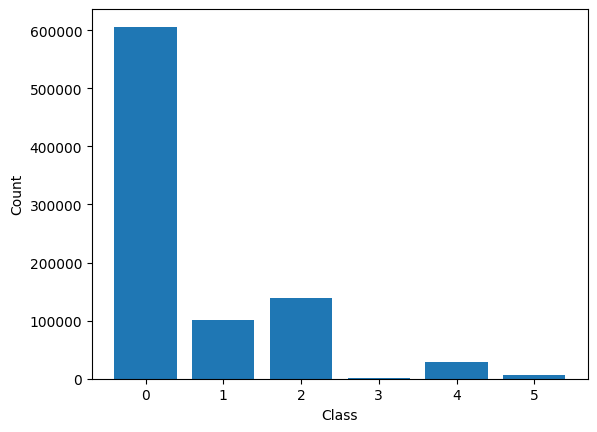

In [ ]:
unique, frequency = np.unique(y_resampled, return_counts = True)
# print unique values array
print("Unique Values:",
      unique)
 
# print frequency array
print("Frequency Values:",
      frequency)

# Get the class distribution of the resampled data
unique, counts = np.unique(y_resampled, return_counts=True)

# Create a bar plot of the class distribution
plt.bar(unique, counts)
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

Apply SMOTE:

In [ ]:
sm = SMOTE(k_neighbors = 500, random_state=42)
X_res, y_res = sm.fit_resample(X_resampled, y_resampled)


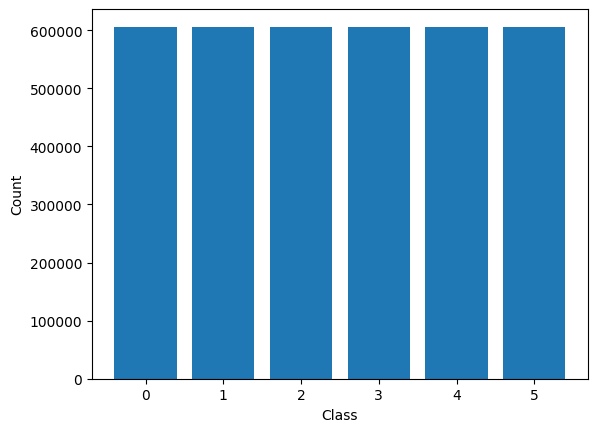

In [ ]:
# Get the class distribution of the resampled data
unique, counts = np.unique(y_res, return_counts=True)

# Create a bar plot of the class distribution
plt.bar(unique, counts)
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

##### Decison Tree - Attack instances only

In [ ]:
dt_model_multiclass=DecisionTreeClassifier()
dt_model_multiclass.fit(X_res, y_res)

dt_pred = dt_model_multiclass.predict(X_test_attack)

print(classification_report(y_test_attack,dt_pred))

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.99      1.00     86742
           2       1.00      0.98      0.99    119609
           3       1.00      1.00      1.00      1032
           4       1.00      1.00      1.00     24885
           5       1.00      1.00      1.00      5865

    accuracy                           0.99    238133
   macro avg       0.83      0.83      0.83    238133
weighted avg       1.00      0.99      0.99    238133



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy increases by 0.1. Recall for class 1, 2, 5 also increase by 0.1 -> higher true positive rates. Let's see if we can increase recall or precision

##### Decision Tree - All instances

In [ ]:
dt_model_multiclass = DecisionTreeClassifier()
dt_model_multiclass.fit(X_res, y_res)
dt_pred_multiclass = dt_model_multiclass.predict(X_test_all)

print(classification_report(y_test_all_multiClass,dt_pred_multiclass))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    519128
           1       0.99      0.99      0.99     43550
           2       0.97      0.98      0.97     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       0.97      1.00      0.98      2908

    accuracy                           0.99    638261
   macro avg       0.99      0.99      0.99    638261
weighted avg       0.99      0.99      0.99    638261



##### Logistic Regression

**NOTE:** This could be the baseline for experimenting upsampling

In [ ]:
from sklearn.linear_model import LogisticRegression


# Instantiate Logistic Regression model
lr = LogisticRegression(multi_class='multinomial')

# Train the model
lr.fit(X_res, y_res)

# Make predictions on the test set
lr_pre = lr.predict(X_test_all)

# Evaluate the performance of the model
accuracy = accuracy_score(y_test_all_multiClass, lr_pre)
print('Accuracy:', accuracy)

print(classification_report(y_test_all_multiClass,lr_pre))

Accuracy: 0.5453850384090521
              precision    recall  f1-score   support

           0       0.85      0.55      0.67    519128
           1       0.03      0.00      0.00     43550
           2       0.26      0.81      0.40     59701
           3       0.65      0.99      0.79       517
           4       0.15      0.89      0.26     12457
           5       0.06      0.96      0.12      2908

    accuracy                           0.55    638261
   macro avg       0.33      0.70      0.37    638261
weighted avg       0.72      0.55      0.59    638261



##### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model_multiclass = RandomForestClassifier()
rf_model_multiclass.fit(X_res, y_res)

rf_pred_multiclass = rf_model_multiclass.predict(X_test_all)

print(classification_report(y_test_all_multiClass, rf_pred_multiclass))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00    519128
           1       0.99      0.99      0.99     43550
           2       0.96      0.98      0.97     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       0.98      1.00      0.99      2908

    accuracy                           0.99    638261
   macro avg       0.99      0.99      0.99    638261
weighted avg       0.99      0.99      0.99    638261



#### SMOTE & Random Undersampling - Binary class

In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter

# apply random undersampling to majority class -> reduce majority class to half
rus = RandomUnderSampler(sampling_strategy={0: 605983}, random_state=42)

X_resampled, y_resampled = rus.fit_resample(X_train_all, y_train_all_binaryClass)

In [ ]:
# Apply SMOTE:
sm = SMOTE(k_neighbors = 500, random_state=42)
X_res, y_res = sm.fit_resample(X_resampled, y_resampled)


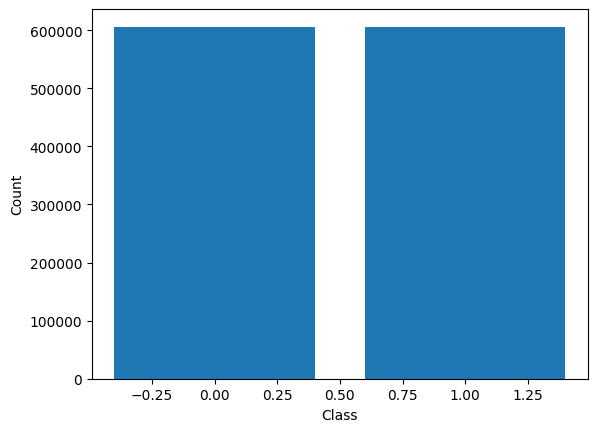

In [ ]:
# Get the class distribution of the resampled data
unique, counts = np.unique(y_res, return_counts=True)

# Create a bar plot of the class distribution
plt.bar(unique, counts)
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

##### Logistic Regression - TODO: add StandardScaler and adjust max_iter

In [ ]:
from sklearn.linear_model import LogisticRegression

# Instantiate Logistic Regression model
lr = LogisticRegression()

# Train the model
lr.fit(X_res, y_res)

# Make predictions on the test set
lr_pre = lr.predict(X_test_all)

# Evaluate the performance of the model
accuracy = accuracy_score(y_test_all_binaryClass, lr_pre)
print('Accuracy:', accuracy)

print(classification_report(y_test_all_binaryClass,lr_pre))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 0.6398620626984886
              precision    recall  f1-score   support

           0       0.94      0.59      0.73    519128
           1       0.32      0.84      0.46    119133

    accuracy                           0.64    638261
   macro avg       0.63      0.72      0.60    638261
weighted avg       0.83      0.64      0.68    638261



##### Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt_model=DecisionTreeClassifier()
dt_model.fit(X_res, y_res)

dt_pred = dt_model.predict(X_test_all)

print(classification_report(y_test_all_binaryClass, dt_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    519128
           1       0.98      0.99      0.98    119133

    accuracy                           0.99    638261
   macro avg       0.99      0.99      0.99    638261
weighted avg       0.99      0.99      0.99    638261



##### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier()
rf_model.fit(X_res, y_res)

rf_pred = rf_model.predict(X_test_all)

print(classification_report(y_test_all_binaryClass, rf_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00    519128
           1       0.98      0.99      0.98    119133

    accuracy                           0.99    638261
   macro avg       0.99      0.99      0.99    638261
weighted avg       0.99      0.99      0.99    638261



## 5. XAI:

### 5.1 LIME

In [ ]:
!pip install lime

The show_in_notebook() function from LIME explainer provides a plot that helps in visualizing how important each feature is in determining the output of the machine learning model. The plot typically consists of a horizontal bar chart with the features on the y-axis and the feature weights or importance on the x-axis.

Each bar in the plot represents a feature, and the length of the bar indicates the weight or importance of the feature. The color of the bar indicates the direction of the feature's impact on the predicted output. Green bars indicate features that increase the predicted output, while red bars indicate features that decrease the predicted output.

Additionally, the plot may have a blue dot that indicates the actual output of the model for the given instance. The dot's position on the x-axis shows the predicted value, and the distance from the dot to the centerline of the plot shows how different the actual output is from the average output for the dataset.

Overall, the plot helps in understanding which features are most important for the model's predictions and how each feature contributes to the output. It also provides a quick way to check whether the model's predictions are reasonable for a given instance.

#### Logistic Regression - Binary Class

In [ ]:
# LIME
import lime
from lime.lime_tabular import LimeTabularExplainer
from lime import lime_tabular
import random


In [ ]:
class_names = [0, 1]

# Create a LimeTabularExplainer object
explainer = LimeTabularExplainer(X_res, feature_names = X_train_all.columns,
                                 class_names=class_names, discretize_continuous=False,
                                 mode='classification', random_state=42)

# Select a random test sample - 375743
test_idx = random.randint(0, len(X_test_all))

print("Random sample is sample #", test_idx)
print("Predicted class: ", lr_pre[test_idx])
print("Actual class: ", y_test_all_binaryClass[test_idx])


# Explain a prediction for a given test sample
explanation = explainer.explain_instance(X_test_all.iloc[100], lr.predict_proba, num_features=10)

# plot the explanation
explanation.show_in_notebook(show_table=True)

Random sample is sample # 477423
Predicted class:  0
Actual class:  0


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [ ]:
# Evaluate LIME performance
from sklearn.metrics import roc_auc_score


y_pred_original = !pip install lime.metrics
y_pred_lime = []
for i in range(X_test_all.shape[0]):
    exp = explainer.explain_instance(X_test_all.iloc[i], lr.predict_proba)
    lime_sample = exp.as_list()
    lime_sample = [x[1] for x in lime_sample]
    y_pred_lime.append(sum(lime_sample))

auc_original = roc_auc_score(y_test_all_binaryClass, y_pred_original)
auc_lime = roc_auc_score(y_test_all_binaryClass, y_pred_lime)
print("AUC Original: ", auc_original)
print("AUC LIME: ", auc_lime)

In [ ]:
lr.predict_proba(X_test_all)[:, 1]

array([0.53670616, 0.50396516, 0.47474078, ..., 0.49967654, 0.17650524,
       0.50016587])

#### Logistic Regression - Multiclass

In [ ]:
class_names = [0, 1, 2, 3, 4, 5]

# Create a LimeTabularExplainer object
explainer = LimeTabularExplainer(X_res, feature_names = X_train_all.columns,
                                 class_names=class_names, discretize_continuous=False,
                                 mode='classification', random_state=42)

# Select a random test sample
test_idx = random.randint(0, len(X_test_all))

print("Random sample is sample #", test_idx)

# Explain a prediction for a given test sample
explanation = explainer.explain_instance(X_test_all.iloc[test_idx], lr.predict_proba, num_features=10)

# plot the explanation
explanation.show_in_notebook(show_table=True)

Random sample is sample # 550055


X does not have valid feature names, but LogisticRegression was fitted with feature names


#### Decision Tree - Binary Class


In [ ]:
# Select a random test sample
test_idx = random.randint(0, len(X_test_all))

print("Random sample is sample #", test_idx)

# Explain a prediction for a given test sample
explanation = explainer.explain_instance(X_test_all.iloc[test_idx], dt_model.predict_proba, num_features=10)

# plot the explanation
explanation.show_in_notebook(show_table=True)

Random sample is sample # 472022


X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


#### Decision Tree - Multi-class

In [ ]:
class_names = [0, 1, 2, 3, 4, 5]

# Create a LimeTabularExplainer object
explainer = LimeTabularExplainer(X_res, feature_names = X_train_all.columns,
                                 class_names=class_names, discretize_continuous=False,
                                 mode='classification', random_state=42)

# Select a random test sample
test_idx = random.randint(0, len(X_test_all))

print("Random sample is sample #", test_idx)

# Explain a prediction for a given test sample
explanation = explainer.explain_instance(X_test_all.iloc[test_idx], dt_model_multiclass.predict_proba, num_features=10)

# plot the explanation
explanation.show_in_notebook(show_table=True)

Random sample is sample # 152617


X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


#### Random Forest - Binary Class

In [ ]:
class_names = [0, 1]

# Create a LimeTabularExplainer object
explainer = LimeTabularExplainer(X_res, feature_names = X_train_all.columns,
                                 class_names=class_names, discretize_continuous=False,
                                 mode='classification', random_state=42)

# Select a random test sample
test_idx = random.randint(0, len(X_test_all))

print("Random sample is sample #", test_idx)

# Explain a prediction for a given test sample
explanation = explainer.explain_instance(X_test_all.iloc[test_idx], rf_model.predict_proba, num_features=10)

# plot the explanation
explanation.show_in_notebook(show_table=True)

Random sample is sample # 84072


X does not have valid feature names, but RandomForestClassifier was fitted with feature names


#### Random Forest - Multi Class

In [ ]:
class_names = [0, 1, 2, 3, 4, 5]

# Create a LimeTabularExplainer object
explainer = LimeTabularExplainer(X_res, feature_names = X_train_all.columns,
                                 class_names=class_names, discretize_continuous=False,
                                 mode='classification', random_state=42)

# Select a random test sample
test_idx = random.randint(0, len(X_test_all))

print("Random sample is sample #", test_idx)

# Explain a prediction for a given test sample
explanation = explainer.explain_instance(X_test_all.iloc[test_idx], rf_model_multiclass.predict_proba, num_features=10)

# plot the explanation
explanation.show_in_notebook(show_table=True)

Random sample is sample # 396344


X does not have valid feature names, but RandomForestClassifier was fitted with feature names


### 5.2 SHAP

The shap.plots.waterfall() plot is a visualization of SHAP values that shows how each feature value for a single instance contributes to the final model output, relative to the expected model output. Here's how to interpret the plot:

The center line represents the expected model output, which is the average of all predictions for the dataset.

Each colored bar represents the contribution of a feature to the model output. The length of the bar corresponds to the magnitude of the SHAP value, which indicates how much that feature value contributed to the final model output.

Positive SHAP values are shown in red, and negative SHAP values are shown in blue.

The starting point of each bar corresponds to the feature's value for the given instance.

The ending point of each bar corresponds to the impact of that feature's value on the model output. The total impact of all the features adds up to the final model output.

Features are sorted by their impact on the model output, with the largest impact on the top and the smallest on the bottom.

In summary, the shap.plots.waterfall() plot provides a clear and intuitive way to understand how individual feature values contribute to the final model output, and can help identify which features are most important for a particular prediction.

In [ ]:
!pip install shap

In [ ]:
# create a background dataset using shap.sample
background = shap.sample(X_test_all, 200)


#### Logistic Regression - Binary classifier

In [ ]:
import shap

# create a SHAP explainer object for the logistic regression model
explainer = shap.Explainer(lr.predict, X_res)

#  Explain a prediction for a given test sample
test_idx = 100

# Generate SHAP values for a specific observation in the test set
shap_values = explainer(background)


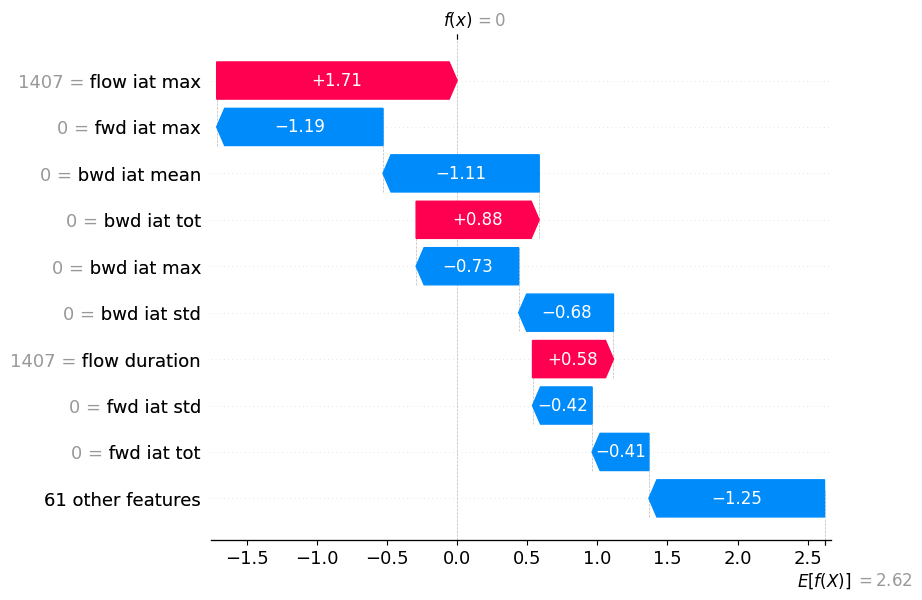

In [ ]:
# Evaluate SHAP values
shap.plots.waterfall(shap_values[1])


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


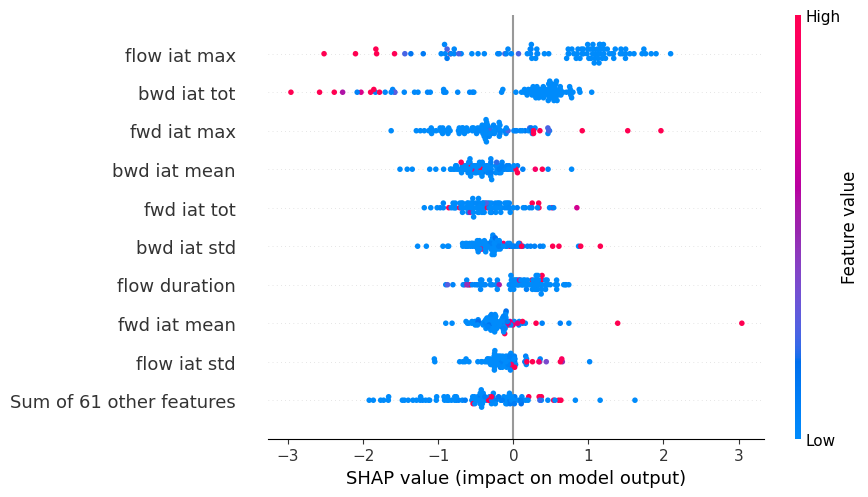

In [ ]:
shap.plots.beeswarm(shap_values)


#### Random Forest - Binary classifier

Permutation explainer: 201it [01:33,  1.92it/s]


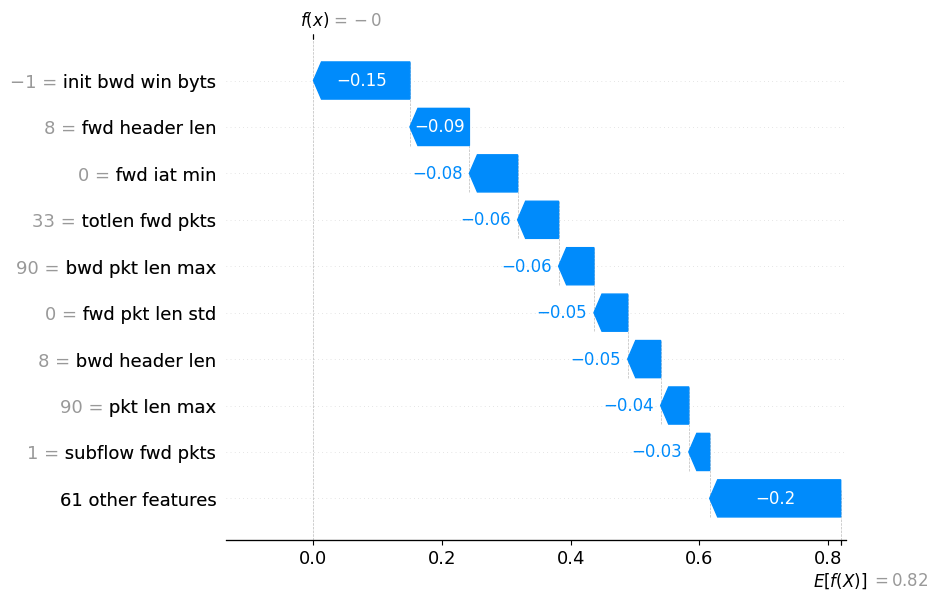

In [ ]:
# create a SHAP explainer object for the logistic regression model
explainer = shap.Explainer(rf_model.predict, X_res)

#  Explain a prediction for a given test sample
test_idx = 3

# Generate SHAP values for a specific observation in the test set
shap_values = explainer(background)

# Evaluate SHAP values
shap.plots.waterfall(shap_values[test_idx])


#### Decision Tree - Multiclass classifier

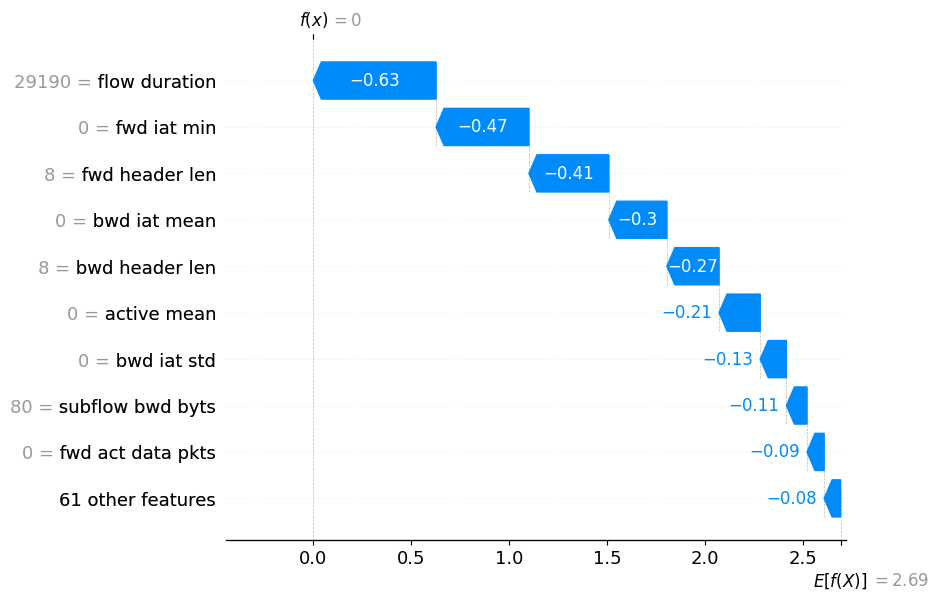

In [ ]:
# create a SHAP explainer object for the logistic regression model
explainer = shap.Explainer(dt_model_multiclass.predict, X_res)

#  Explain a prediction for a given test sample
test_idx = 196

# Generate SHAP values for a specific observation in the test set
shap_values = explainer(background)

# Evaluate SHAP values
shap.plots.waterfall(shap_values[test_idx])


### 5.3 GAM

Generalized Additive Models (GAMs) are used in XAI to explain complex non-linear relationships between a dependent variable and multiple independent variables. GAMs are similar to linear regression models but can handle non-linear relationships by using smooth functions such as splines or local regression.

In the context of explaining machine learning models, GAMs can be used to analyze the impact of individual input features on the output of the model. This can help identify which features are most important in the prediction and how they interact with each other. By visualizing the smooth functions in GAMs, we can gain insights into the non-linear relationships between the input features and the output.

GAMs can also be used for feature selection and feature engineering by identifying the most important features and transforming them to improve model performance. Additionally, GAMs can be used for anomaly detection and outlier detection by identifying data points that do not fit the smooth function.

Overall, GAMs are a powerful tool for XAI as they can handle complex non-linear relationships, provide insights into feature importance and interactions, and aid in feature selection and engineering.

In [ ]:
!pip install pygam


##### Logistic Regression - Binary Classifier

In [ ]:
from pygam import LogisticGAM

gam = LogisticGAM().fit(X_res, y_res)

gam.summary()

divide by zero encountered in true_divide
invalid value encountered in multiply


KeyboardInterrupt: ignored

### 5.4 Decision Tree

The shap.summary_plot() function creates a summary plot that shows the most important features in a model and how they affect the model's output. The plot consists of horizontal bars for each feature, sorted by the magnitude of the feature's SHAP value, and color-coded to indicate whether the feature has a positive or negative impact on the model's output.

The plot also includes a vertical dashed line at the center of the plot, representing the model's base value (the average output of the model for the training set). The features to the left of the line have a negative impact on the model's output, while the features to the right have a positive impact.

Interpreting the plot involves looking at the magnitude and direction of the SHAP values for each feature. Features with large positive SHAP values have a strong positive impact on the model's output, while features with large negative SHAP values have a strong negative impact. Features with SHAP values close to zero have little impact on the model's output.

It's also important to note that the magnitude of the SHAP values is relative to the range of the feature. Features with larger ranges may have larger absolute SHAP values, but that does not necessarily mean they are more important than features with smaller ranges.

Overall, the SHAP summary plot can be used to identify the most important features in a model and how they affect the model's output. This information can be used to gain insights into the model's behavior and potentially identify areas for improvement"

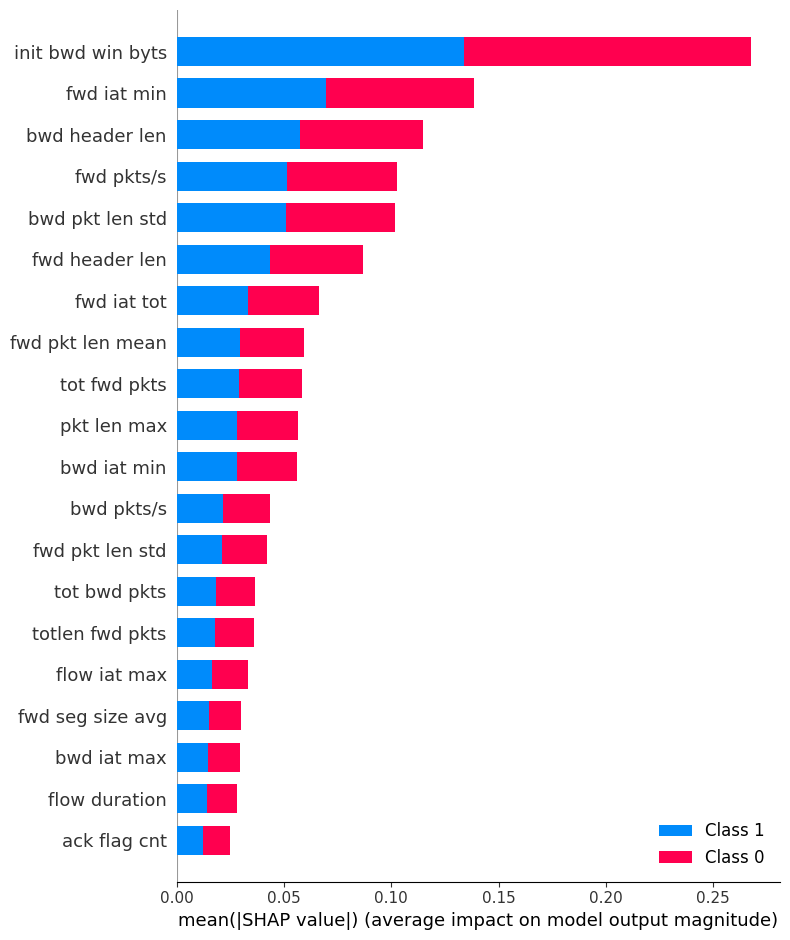

In [ ]:
# Create a TreeExplainer object
explainer = shap.TreeExplainer(dt_model, X_res)

# Compute SHAP values for a set of input features
shap_values = explainer.shap_values(background)

# Visualize the SHAP values
shap.summary_plot(shap_values, background, feature_names=X_train_all.columns)




## Experimenting different sampling strategies

Unique Values: [0 1 2 3 4 5]
Frequency Values: [605983  57793  79252    698  16521   4043]


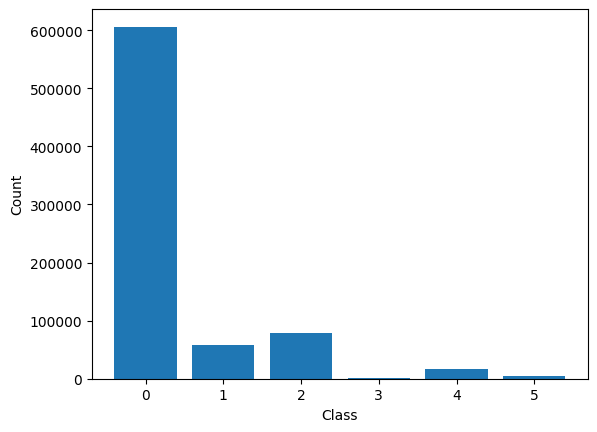

In [ ]:
# Get the class distribution of the under_resampled data
unique, counts = np.unique(y_resampled, return_counts=True)

# print unique values array
print("Unique Values:",
      unique)
 
# print frequency array
print("Frequency Values:",
      counts)

# Create a bar plot of the class distribution
plt.bar(unique, counts)
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

**Strategy 1**: I want to increase higher true positive rates for class 2 to get higher recall, hence I will try to upsample class 2 so that it has more samples than other classes -> **not completely balanced after upsampling**. Want to retain the same ratio among malicious instances

In [ ]:
sampling_strategy = {
    1:  100985 + 450000,
    2: 139160 + 450000,
    3: 1213 + 450000,
    4: 28949 + 450000,
    5: 7000 + 450000
}
sm = SMOTE(sampling_strategy=sampling_strategy, k_neighbors = 500, random_state=42)
X_res, y_res = sm.fit_resample(X_resampled, y_resampled)


Class distribution after resampling: Counter({0: 605983, 2: 589160, 1: 550985, 4: 478949, 5: 457000, 3: 451213})


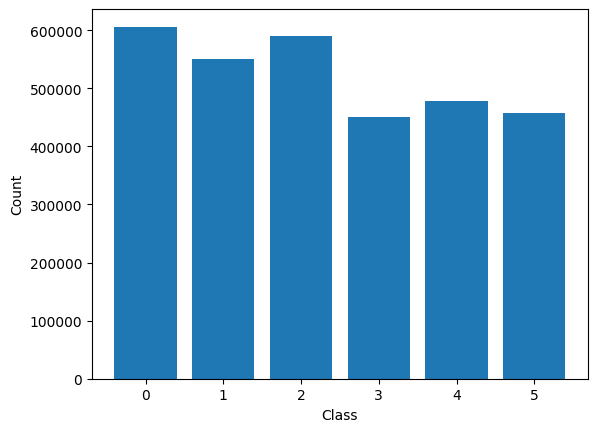

In [ ]:
# print class distribution after resampling
print('Class distribution after resampling:', Counter(y_res))

# Get the class distribution of the under_resampled data
unique, counts = np.unique(y_res, return_counts=True)

# Create a bar plot of the class distribution
plt.bar(unique, counts)
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

Re-run decision tree

In [ ]:
dt_model=DecisionTreeClassifier()
dt_model.fit(X_res, y_res)

# binary instance
dt_pred = dt_model.predict(X_test_attack)
print(classification_report(y_test_attack,dt_pred))

print("----------------------------------")

# all instances
dt_pred = dt_model.predict(X_test_all)
print(classification_report(y_test_all_multiClass,dt_pred))

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.99      1.00     43550
           2       1.00      0.98      0.99     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       1.00      1.00      1.00      2908

    accuracy                           0.99    119133
   macro avg       0.83      0.83      0.83    119133
weighted avg       1.00      0.99      0.99    119133

----------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    519128
           1       0.99      0.99      0.99     43550
           2       0.97      0.98      0.97     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       0.97      1.00      0.99      2908

    accuracy                           0.9

**Strategy 2:** Upsample more on classes that have lower number of samples

In [ ]:
# Unique Values: [0 1 2 3 4 5]
# Frequency Values: [605983 100985 139160   1213  28949   7000]

sampling_strategy = {
    1:  100985 + 250000,
    2: 139160 + 250000,
    3: 1213 + 550000,
    4: 28949 + 400000,
    5: 7000 + 500000
}
sm = SMOTE(sampling_strategy=sampling_strategy, k_neighbors = 500, random_state=42)
X_res, y_res = sm.fit_resample(X_resampled, y_resampled)


Class distribution after resampling: Counter({0: 605983, 3: 551213, 5: 507000, 4: 428949, 2: 389160, 1: 350985})


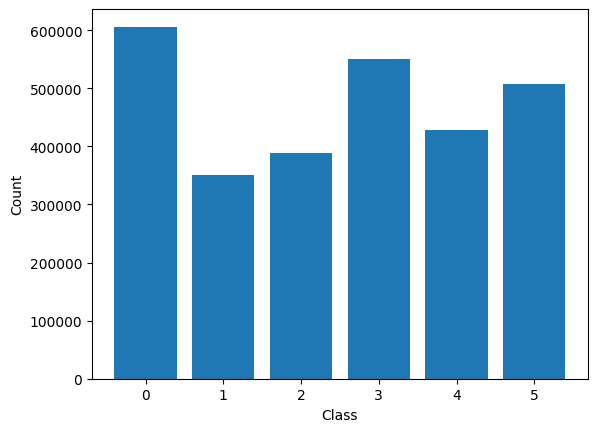

In [ ]:
# print class distribution after resampling
print('Class distribution after resampling:', Counter(y_res))

# Get the class distribution of the under_resampled data
unique, counts = np.unique(y_res, return_counts=True)

# Create a bar plot of the class distribution
plt.bar(unique, counts)
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

Re-run decision tree

In [ ]:
dt_model=DecisionTreeClassifier()
dt_model.fit(X_res, y_res)

# binary instance
dt_pred = dt_model.predict(X_test_attack)
print(classification_report(y_test_attack,dt_pred))

print("----------------------------------")

# all instances
dt_pred = dt_model.predict(X_test_all)
print(classification_report(y_test_all_multiClass,dt_pred))

/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.99      1.00     43550
           2       1.00      0.98      0.99     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       1.00      1.00      1.00      2908

    accuracy                           0.99    119133
   macro avg       0.83      0.83      0.83    119133
weighted avg       1.00      0.99      0.99    119133

----------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    519128
           1       0.99      0.99      0.99     43550
           2       0.97      0.98      0.97     59701
           3       1.00      1.00      1.00       517
           4       1.00      1.00      1.00     12457
           5       0.97      1.00      0.98      2908

    accuracy                           0.9

#### Random Undersampling with Tomek Links

**Strategy 3:** I want to increase higher true positive rates for class 2 to get higher recall, hence I will try to upsample class 2 while downsample other classes with Tomek links. Random undersampling involves randomly removing examples from the majority class(es) until the class distribution is balanced. Tomek links, on the other hand, identify pairs of examples from different classes that are closest to each other and remove the examples from the majority class

In [ ]:
from imblearn.under_sampling import TomekLinks

# print class distribution before resampling
print('Class distribution before resampling:', Counter(y_train_all_multiClass))

# X is the feature matrix and y is the target vector
tomek = TomekLinks()
X_resampled, y_resampled = tomek.fit_resample(X_train_all, y_train_all_multiClass)


# print class distribution after resampling
print('Class distribution after resampling:', Counter(y_resampled))



Class distribution before resampling: Counter({0: 1211967, 2: 139160, 1: 100985, 4: 28949, 5: 7000, 3: 1213})
